# <p align="center">Hotel Customer Segmentation</p>

---

## <p align="center">*2 - Clustering*</p>

---

### 👥 **Team Members**
- **Ana Farinha** *(Student Number: 20211514)*  
- **António Oliveira** *(Student Number: 20211595)*  
- **Mariana Neto** *(Student Number: 20211527)*  
- **Salvador Domingues** *(Student Number: 20240597)*  

📅 **Date:** *March 10, 2025*  
📍 **Prepared for:** *Hotel H*  

---

# ToC

<a class="anchor" id="top"></a>


1. [Import Libraries & Data](#1.-Import-Libraries-&-Data) <br><br>

2. ["Regular" Clustering](#2.-"Regular"-Clustering)<br>

    2.1 [Hierarchical Clustering](#2.1-Hierarchical-Clustering) <br>
    
    2.2 [K-Means](#2.2-K-Means) <br><br>
    
3. [Clustering with Dimensionality Reduction](#3.-Clustering-with-Dimensionality-Reduction)<br>

    3.1 [Principal Components Analysis](#3.1-Principal-Components-Analysis) <br>
    
    3.2 [K-Means](#3.2-K-Means) <br>
    
    3.3 [DBSCAN](#3.3-DBSCAN) <br><br>


    &emsp; 2.4.1 [TEMP](#2.4.1-TEMP)<br><br>
 
 

# 1. Import Libraries & Data

In [1]:
import pandas as pd
import numpy as np

# Clustering Algorithms
from sklearn.cluster import DBSCAN, MeanShift, KMeans, \
    AgglomerativeClustering, estimate_bandwidth
from sklearn.decomposition import PCA
import umap.umap_ as umap
from sklearn.neighbors import NearestNeighbors

# Scaling
from sklearn.preprocessing import MinMaxScaler

# Visualisations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import InterclusterDistance
from yellowbrick.cluster import SilhouetteVisualizer

# External Functions File
import functions as f

pd.set_option('display.max_columns', None)

# Suppress Warnings
import warnings
warnings.filterwarnings("ignore")

**Data**

In [2]:
df = pd.read_csv('./treated_data.csv', index_col = 'Unnamed: 0')
df

,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,TotalRevenue,LTV,RetentionRate,RevenuePerNight,RevenuePerPersonNight,PreferenceScore,NumberOfSR,LeadTimeCategory_Last-minute,LeadTimeCategory_Planner,AgeGroup_Senior,AgeGroup_Young,CustomerCategory_New,CustomerCategory_Recent,NationalityEncoded,DistributionChannelEncoded,FlagOutlier
0,60.0,479.0,1.0,177.0,14.0,0.0,0.0,1.0,2.0,1.0,0,0,1,0,1,191.0,0.397917,0.5,95.500000,63.666667,1,1,1.0,0.0,1.0,0.0,0.0,1.0,0.148657,0.137226,0
1,60.0,480.0,127.0,318.0,148.0,0.0,0.0,1.0,4.0,2.0,0,0,1,0,1,466.0,0.968815,0.5,155.333333,93.200000,1,1,0.0,0.0,1.0,0.0,0.0,1.0,0.148657,0.823198,0
2,54.0,1197.0,14.0,695.0,100.0,0.0,0.0,1.0,10.0,5.0,1,0,1,0,0,795.0,0.663606,0.5,132.500000,72.272727,2,2,0.0,1.0,1.0,0.0,0.0,0.0,0.135207,0.823198,0
5,53.0,755.0,56.0,165.0,12.0,0.0,0.0,1.0,3.0,1.0,0,0,0,0,0,177.0,0.234127,0.5,88.500000,44.250000,0,0,0.0,0.0,1.0,0.0,0.0,1.0,0.058532,0.823198,0
7,33.0,673.0,2.0,237.0,71.6,0.0,0.0,1.0,3.0,3.0,0,0,0,0,0,308.6,0.457864,0.5,77.150000,77.150000,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.148657,0.823198,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108200,22.0,159.0,69.0,212.0,32.0,0.0,0.0,1.0,4.0,2.0,0,0,0,1,0,244.0,1.525000,0.5,81.333333,48.800000,1,1,0.0,0.0,0.0,1.0,1.0,0.0,0.044204,0.823198,0
108201,54.0,209.0,83.0,256.5,74.4,0.0,0.0,1.0,6.0,3.0,0,0,0,1,0,330.9,1.575714,0.5,82.725000,47.271429,1,1,0.0,0.0,1.0,0.0,1.0,0.0,0.016596,0.823198,0
108203,41.0,783.0,58.0,218.0,14.0,0.0,0.0,1.0,2.0,2.0,0,0,0,0,0,232.0,0.295918,0.5,77.333333,77.333333,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.016596,0.137226,0
108204,19.0,46.0,89.0,911.7,31.0,0.0,0.0,1.0,14.0,7.0,0,0,1,0,0,942.7,20.057447,0.5,117.837500,62.846667,1,1,0.0,0.0,0.0,1.0,1.0,0.0,0.148657,0.823198,0


**Split Outliers from the rest of the data**

In [3]:
# Separate outliers
outliers = df[df['FlagOutlier'] == 1]

# Save outliers to a separate file
# outliers.to_csv("outliers.csv", index=False)

# Remove outliers from original DataFrame
df = df[df['FlagOutlier'] != 1]

Removing Columns not relevant for clustering purposes

In [4]:
df.drop(['FlagOutlier'], axis = 1, inplace = True)

**Scaling**

In [5]:
scaled_data = MinMaxScaler().fit_transform(df)
scaled_data = pd.DataFrame(scaled_data, 
                           columns=df.columns, 
                           index=df.index)

In [6]:
scaled_data.head(3)

,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,TotalRevenue,LTV,RetentionRate,RevenuePerNight,RevenuePerPersonNight,PreferenceScore,NumberOfSR,LeadTimeCategory_Last-minute,LeadTimeCategory_Planner,AgeGroup_Senior,AgeGroup_Young,CustomerCategory_New,CustomerCategory_Recent,NationalityEncoded,DistributionChannelEncoded
0,0.594595,0.328391,0.001821,0.024394,0.004388,0.0,0.0,0.0,0.014085,0.000000,0.0,0.0,1.0,0.0,1.0,0.025631,0.005034,0.266667,0.083984,0.070056,0.333333,0.333333,1.0,0.0,1.0,0.0,0.0,1.0,1.000000,0.158524
1,0.594595,0.329133,0.231330,0.043826,0.046389,0.0,0.0,0.0,0.042254,0.017241,0.0,0.0,1.0,0.0,1.0,0.062728,0.012270,0.266667,0.136761,0.102700,0.333333,0.333333,0.0,0.0,1.0,0.0,0.0,1.0,1.000000,1.000000
2,0.513514,0.860638,0.025501,0.095783,0.031344,0.0,0.0,0.0,0.126761,0.068966,1.0,0.0,1.0,0.0,0.0,0.107109,0.008401,0.266667,0.116620,0.079569,0.666667,0.666667,0.0,1.0,1.0,0.0,0.0,0.0,0.909516,1.000000


# 2. "Regular" Clustering

<a href="#top">Top &#129033;</a>

## 2.1 Hierarchical Clustering

In [10]:
# agg_clust = AgglomerativeClustering(compute_distances=True).fit(scaled_data)

In [13]:
# Plot Hierarchical Clustering Dendrogram
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    '''
    Create linkage matrix and then plot the dendrogram
    Arguments: 
    - model(HierarchicalClustering Model): hierarchical clustering model.
    - **kwargs
    '''
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)
    
    # Plot the dendrogram
    dendrogram(linkage_matrix, **kwargs)

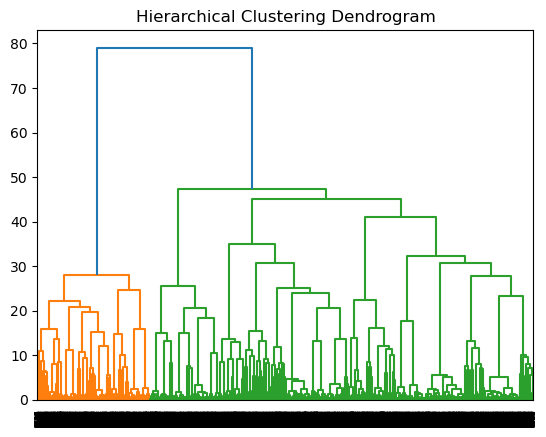

In [14]:
# fig, ax = plt.subplots()
# plt.title("Hierarchical Clustering Dendrogram")
# # plot the top three levels of the dendrogram
# plot_dendrogram(agg_clust, truncate_mode="level", p=50)
# plt.axhline(y = 200, color = 'r', linestyle = '-')

# plt.show()

**Final Model for HC**

In [16]:
# linkage = 'complete'
# distance = 'manhattan'
# n_clusters = 2

# hclust = AgglomerativeClustering(linkage=linkage, 
#                                  metric=distance, 
#                                  n_clusters=n_clusters)

# hc_labels = hclust.fit_predict(temp)

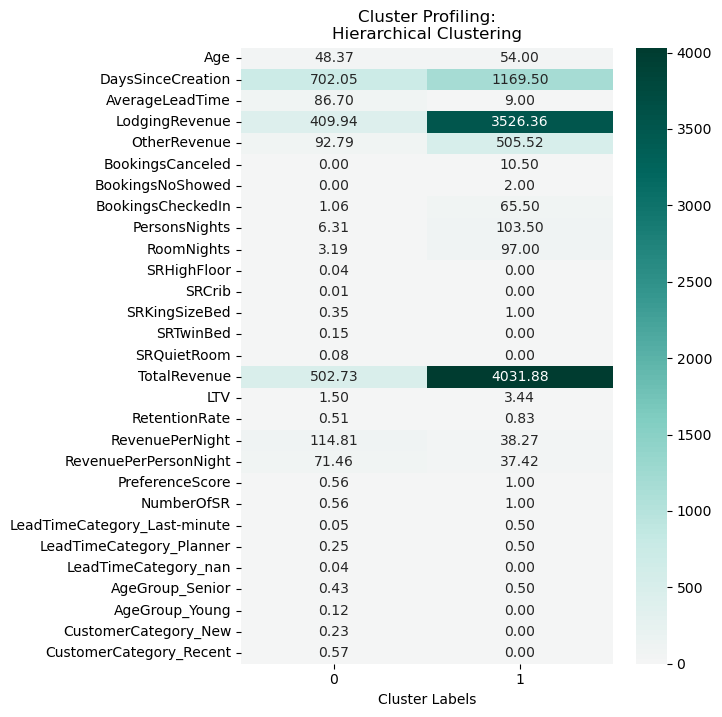

In [17]:
# f.cluster_profiling(df, hc_labels, "Hierarchical")
# f.plot_counts(hc_labels)

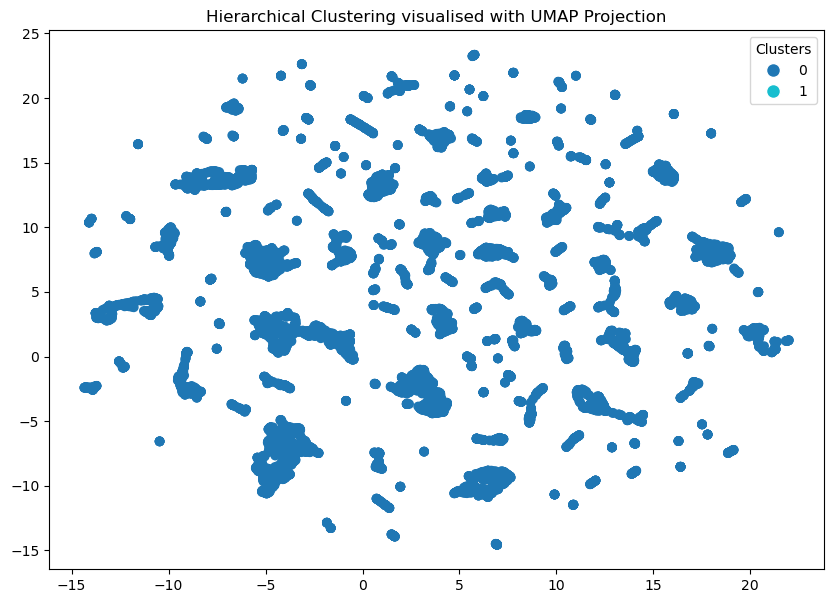

In [23]:
umap_object = umap.UMAP(n_neighbors = 5)

umap_embedding = umap_object.fit_transform(temp)

plot_dim_reduction(umap_embedding, targets = hc_labels,
                   technique = 'Hierarchical Clustering visualised with UMAP')

## 2.2 K-Means

**Elbow Method**

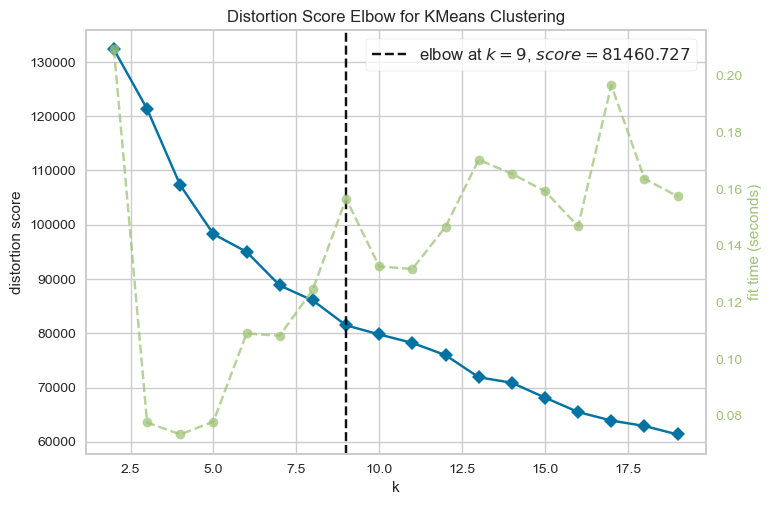

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [9]:
model = KMeans(random_state=42)
k=(2, 20)
color = 'green'

visualizer1 = KElbowVisualizer(model, k=k, color=color)
visualizer1.fit(scaled_data)
visualizer1.show()

**Final Model for KM**

In [10]:
kmclust = KMeans(n_clusters = 9)

km_labels = kmclust.fit_predict(scaled_data)

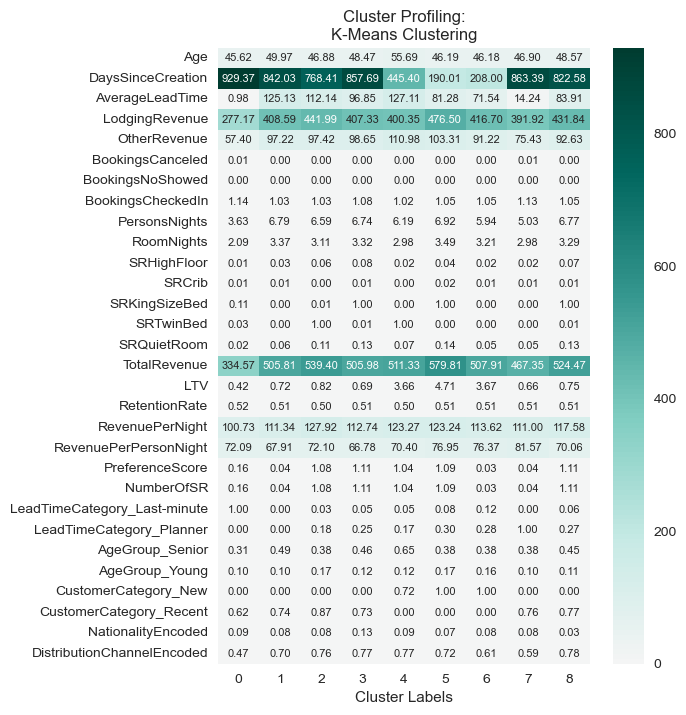

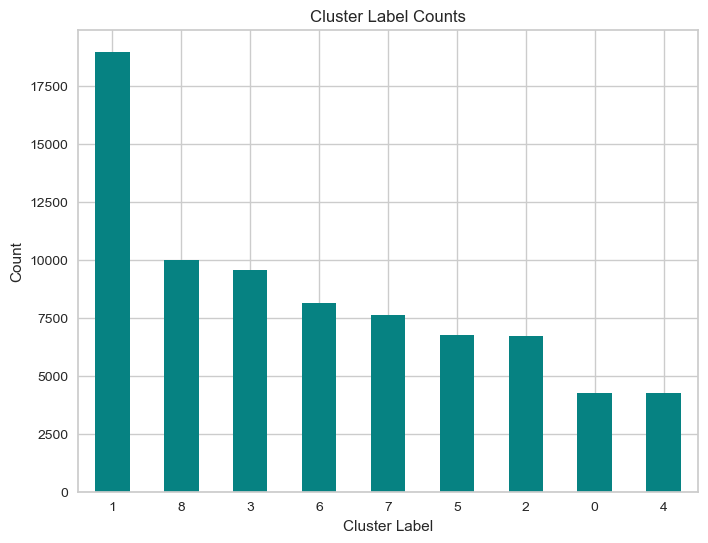

In [12]:
f.plot_cluster_profiling(df, km_labels, "K-Means", annot_size = 8)
f.plot_counts(km_labels)

**UMAP Visualisation**

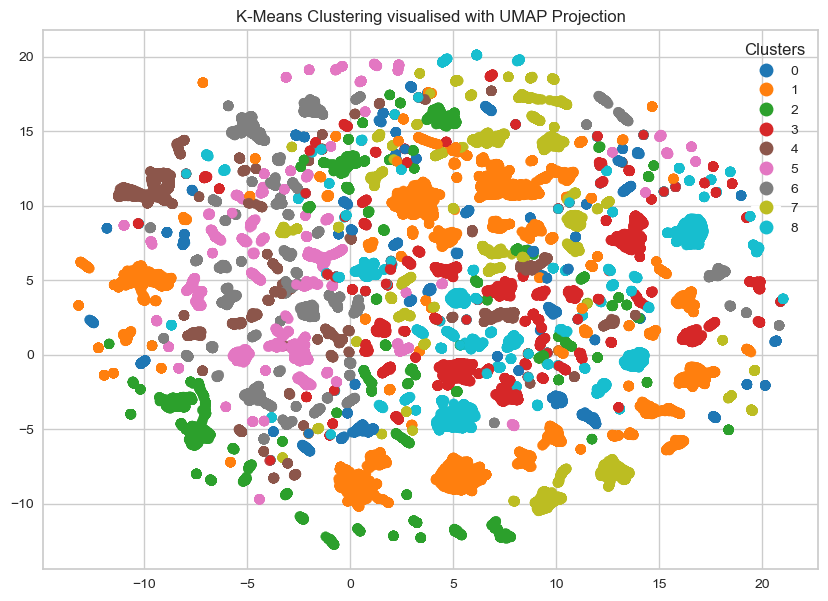

In [16]:
umap_object = umap.UMAP(n_neighbors = 10)
umap_embedding = umap_object.fit_transform(scaled_data)

f.plot_dim_reduction(umap_embedding, targets = km_labels,
                   technique = 'K-Means Clustering visualised with UMAP')

## 2.3 DBSCAN

<a href="#top">Top &#129033;</a>

In [18]:
# K-distance graph to determine the optimal eps value
neigh = NearestNeighbors(n_neighbors=50)
neigh.fit(scaled_data)
distances, _ = neigh.kneighbors(scaled_data)
distances = np.sort(distances[:, -1])

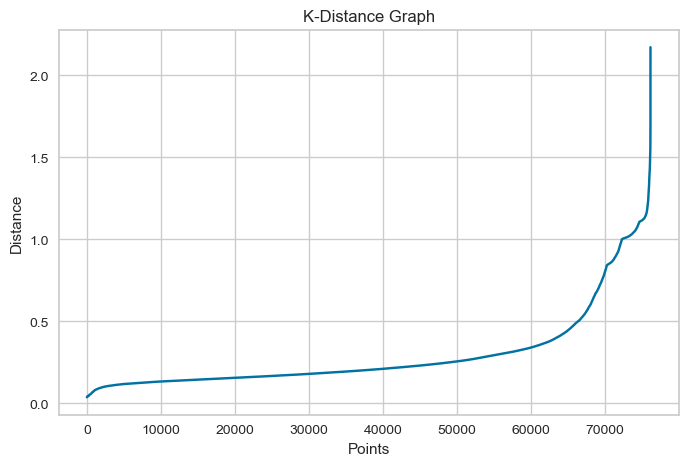

In [19]:
plt.figure(figsize=(8, 5))
plt.plot(distances)
#plt.axhline(y=1.25, color='red', linestyle='--', label='Potential eps')
plt.xlabel("Points")
plt.ylabel("Distance")
plt.title("K-Distance Graph")
plt.legend()
plt.show()

In [27]:
# Perform DBSCAN clustering
eps_value = 1.1
dbscan = DBSCAN(eps=eps_value, min_samples=5)
dbscan_labels = dbscan.fit_predict(scaled_data)

In [28]:
# Number of estimated clusters
n_clusters = len(np.unique(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
print(f"Number of estimated clusters: {n_clusters}")

Number of estimated clusters: 2


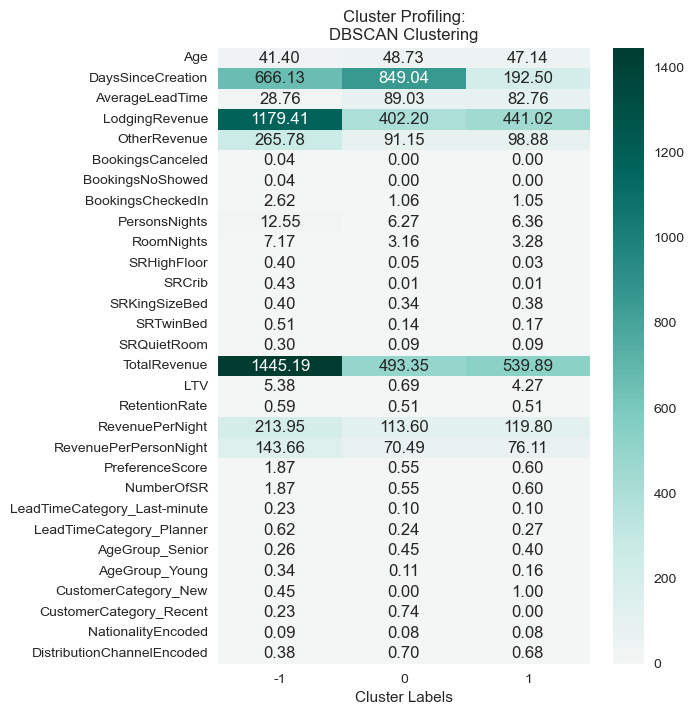

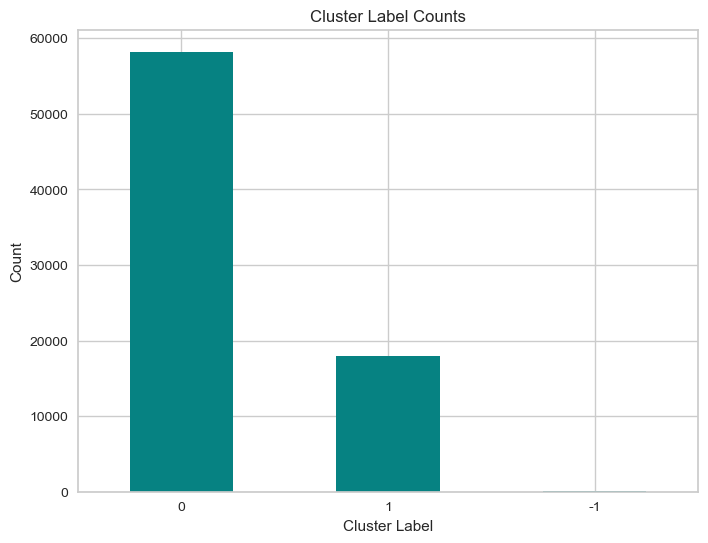

In [29]:
# Profiling and visualization
f.cluster_profiling(df, dbscan_labels, "DBSCAN")
f.plot_counts(dbscan_labels)

**UMAP Visualisation**

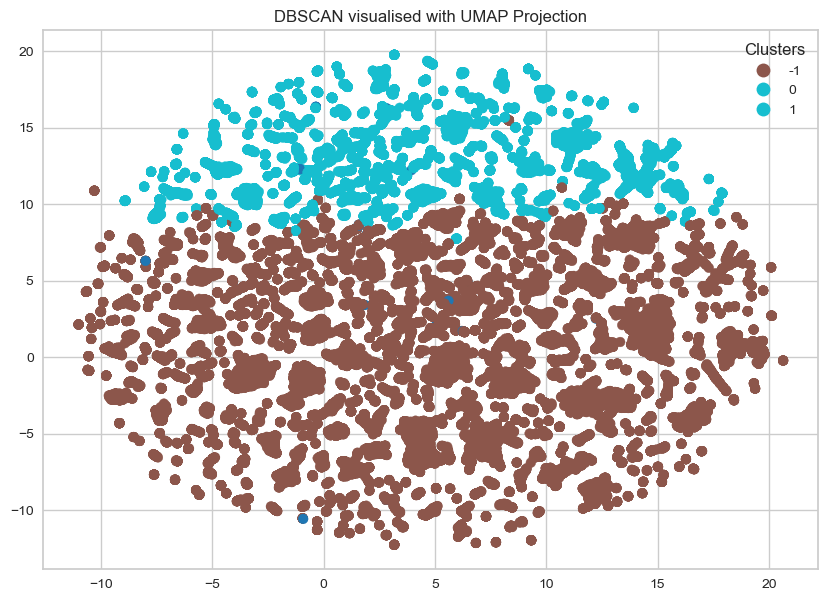

In [33]:
umap_object = umap.UMAP(n_neighbors=5)
umap_embedding = umap_object.fit_transform(scaled_data)

f.plot_dim_reduction(umap_embedding, targets=dbscan_labels, technique='DBSCAN visualised with UMAP')

In [34]:
# Detecting noise (potential outliers)
outliers = df[dbscan_labels == -1]
print(f"Number of detected outliers: {len(outliers)}")

Number of detected outliers: 47


# 3. Clustering with Dimensionality Reduction

<a href="#top">Top &#129033;</a>

## 3.1 Principal Components Analysis

<a href="#top">Top &#129033;</a>

**Explained Variance vs Number of Components**

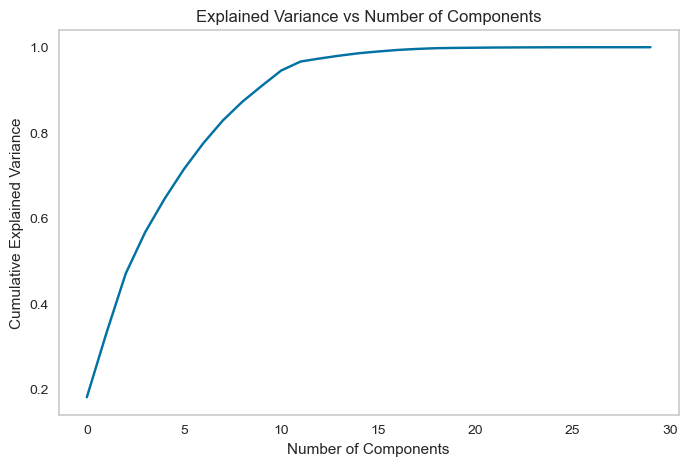

In [35]:
pca_full = PCA()
pca_full.fit(scaled_data)
cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)


plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.title('Explained Variance vs Number of Components')
plt.show()

In [36]:
# Create DataFrame with all PCs
pcaDF = pd.DataFrame({
    'Component': range(1, len(pca_full.explained_variance_ratio_) + 1),
    'Variance explained': pca_full.explained_variance_ratio_,
    'Cumulative variance explained': np.cumsum(pca_full.explained_variance_ratio_)
})

pcaDF


,Component,Variance explained,Cumulative variance explained
0,1,1.813977e-01,0.181398
1,2,1.488646e-01,0.330262
2,3,1.402243e-01,0.470487
3,4,9.676008e-02,0.567247
4,5,7.821845e-02,0.645465
5,6,6.963317e-02,0.715098
6,7,6.072524e-02,0.775824
7,8,5.291897e-02,0.828743
8,9,4.375644e-02,0.872499
9,10,3.713191e-02,0.909631


**2 PCs**

In [37]:
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(scaled_data)

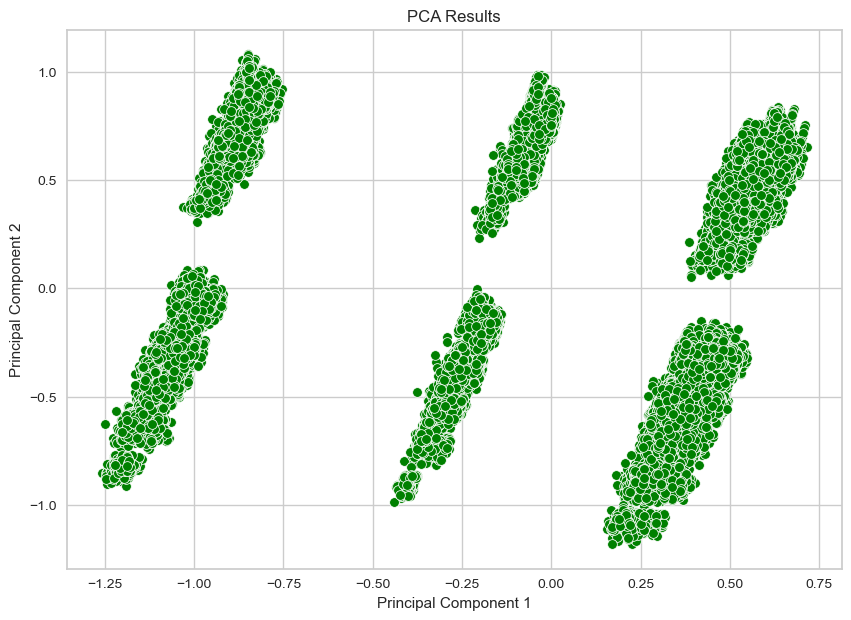

In [38]:
X_pca_df2 = pd.DataFrame(X_pca2, columns=['PC1', 'PC2'])

plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', data=X_pca_df2, color='green')
plt.title('PCA Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


**3 PCs**

In [9]:
pca3 = PCA(n_components=3)
X_pca3 = pca3.fit_transform(scaled_data)
X_pca_df3 = pd.DataFrame(X_pca3, columns=['PC1', 'PC2', 'PC3'])

# Interactive 3D Plot
fig = px.scatter_3d(X_pca_df3, x='PC1', y='PC2', z='PC3', color=X_pca_df3.index,  
                    title='Interactive 3D PCA Plot', color_continuous_scale='Greens', opacity=0.8)

fig.update_traces(marker=dict(size=7, line=dict(width=1, color='darkgreen')))
fig.update_layout(scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'))

fig.show()

***N* PCs**

In [39]:
pca13 = PCA(n_components=13)
X_pca13 = pca13.fit_transform(scaled_data)

**Explained Variance Ratio by Principal Component**

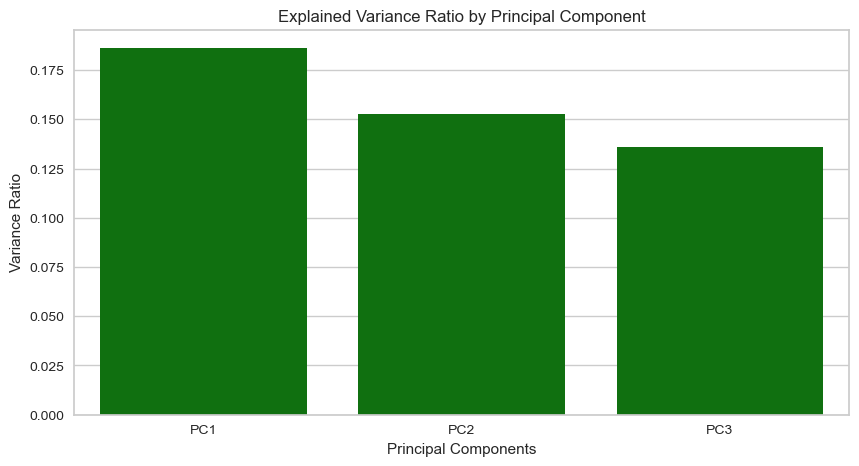

In [11]:
explained_variance = pca3.explained_variance_ratio_

plt.figure(figsize=(10, 5))
sns.barplot(x=[f'PC{i+1}' for i in range(len(explained_variance))], y=explained_variance, color='green')
plt.title('Explained Variance Ratio by Principal Component')
plt.xlabel('Principal Components')
plt.ylabel('Variance Ratio')
plt.show()


If a column has high absolute values in a component, that feature strongly influences that component.
We can determine which features contribute most to variance in the data.

In [12]:
# Create a dataframe with the weights per component
weights_df = pd.DataFrame(pca3.components_,columns=df.columns)
weights_df.T

,0,1,2
Age,0.055118,0.309728,0.036457
DaysSinceCreation,0.223411,-0.005298,-0.007059
AverageLeadTime,0.024498,0.085439,0.005786
LodgingRevenue,-0.000842,-0.002081,0.002109
OtherRevenue,-0.000415,0.002302,0.000792
BookingsCanceled,0.000047,-0.000028,0.000139
BookingsNoShowed,0.000060,-0.000017,0.000074
BookingsCheckedIn,0.000060,-0.000132,0.000155
PersonsNights,0.000032,0.000980,0.003952
RoomNights,-0.000090,0.000613,0.001479


<div class="alert-danger">
  
este código em baixo faz o mesmo que em cima, soq apenas para um dos PCs de cada vez

In [30]:
comp = abs(weights_df.iloc[2])  ## index 14 is component 15
comp = comp.sort_values(ascending=False)
comp

SRKingSizeBed                   0.896624
SRTwinBed                       0.240226
NumberOfSR                      0.182810
PreferenceScore                 0.182810
DistributionChannelEncoded      0.171024
AgeGroup_Senior                 0.121626
SRQuietRoom                     0.097150
NationalityEncoded              0.070530
LeadTimeCategory_Last-minute    0.062133
SRHighFloor                     0.055244
LeadTimeCategory_Planner        0.045662
AgeGroup_Young                  0.041469
Age                             0.036457
CustomerCategory_Recent         0.028285
SRCrib                          0.007935
DaysSinceCreation               0.007059
CustomerCategory_New            0.006286
AverageLeadTime                 0.005786
PersonsNights                   0.003952
TotalRevenue                    0.002163
LodgingRevenue                  0.002109
RoomNights                      0.001479
RevenuePerPersonNight           0.001248
RetentionRate                   0.001114
OtherRevenue    

## 3.2 K-Means

<a href="#top">Top &#129033;</a>

**Elbow Method**

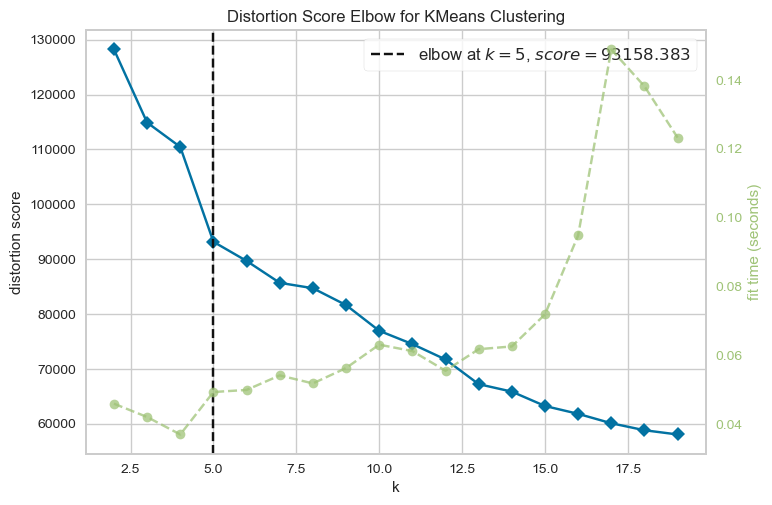

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [40]:
model = KMeans(random_state=42)
k=(2, 20)
color = 'green'

visualizer1 = KElbowVisualizer(model, k=k, color=color)
visualizer1.fit(X_pca13)
visualizer1.show()

**Final Model for K-Means on PCA**

In [42]:
kmeans = KMeans(n_clusters = 5, random_state=42)
km_labels = kmeans.fit_predict(X_pca13)

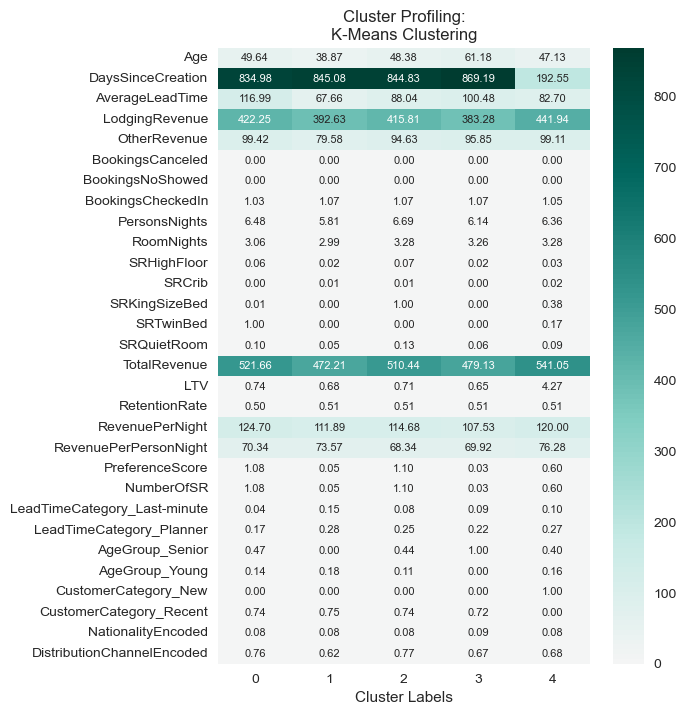

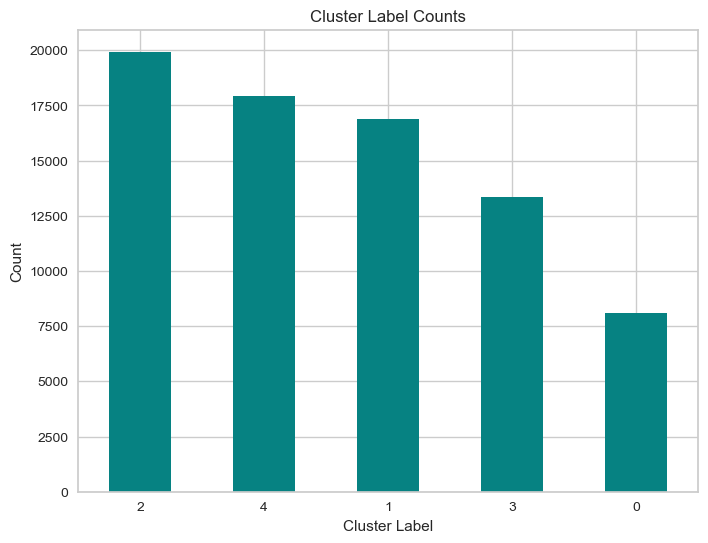

In [43]:
# Profiling and visualization
f.plot_cluster_profiling(df, km_labels, "K-Means", annot_size = 8)
f.plot_counts(km_labels)

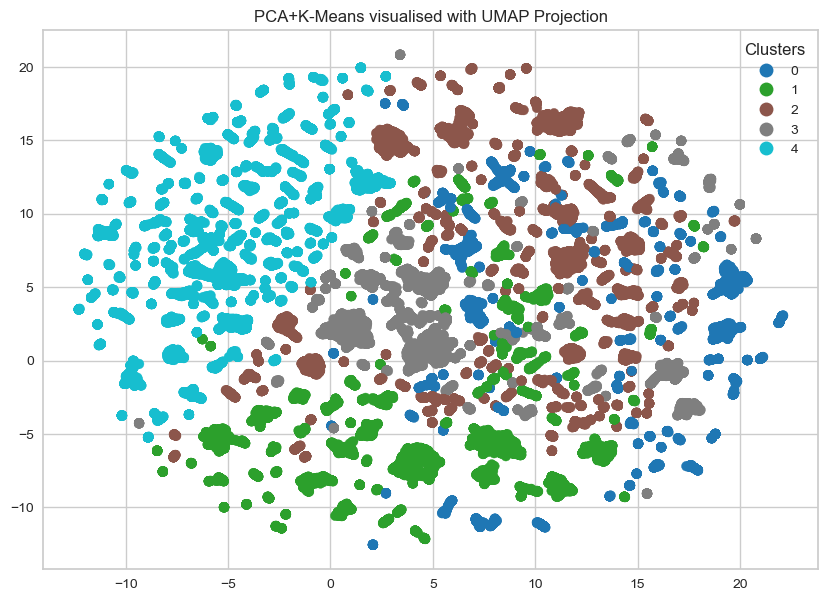

In [45]:
umap_object = umap.UMAP(n_neighbors = 10)
umap_embedding = umap_object.fit_transform(scaled_data)

f.plot_dim_reduction(umap_embedding, targets=km_labels, technique='PCA+K-Means visualised with UMAP')

## 3.3 DBSCAN

<a href="#top">Top &#129033;</a>

In [9]:
# K-distance graph to determine the optimal eps value
neigh = NearestNeighbors(n_neighbors=50)
neigh.fit(X_pca13)
distances, _ = neigh.kneighbors(X_pca13)
distances = np.sort(distances[:, -1])

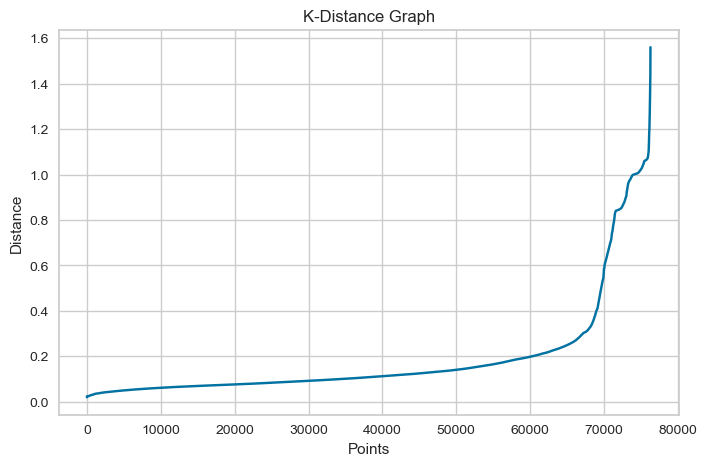

In [10]:
plt.figure(figsize=(8, 5))
plt.plot(distances)
#plt.axhline(y=1.25, color='red', linestyle='--', label='Potential eps')
plt.xlabel("Points")
plt.ylabel("Distance")
plt.title("K-Distance Graph")
plt.legend()
plt.show()

**Final Model for DBSCAN on PCA**

In [21]:
# eps_value = 0.4  
dbscan = DBSCAN()
dbscan_labels = dbscan.fit_predict(X_pca13)

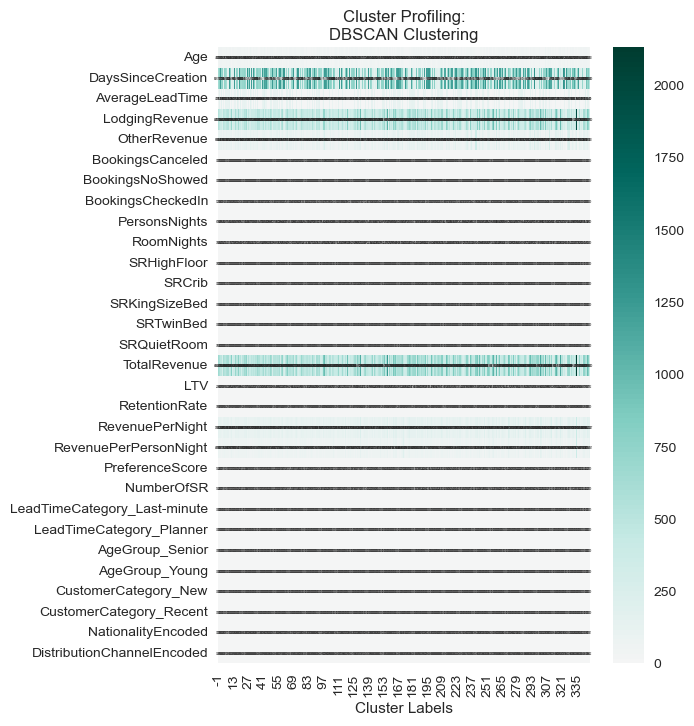

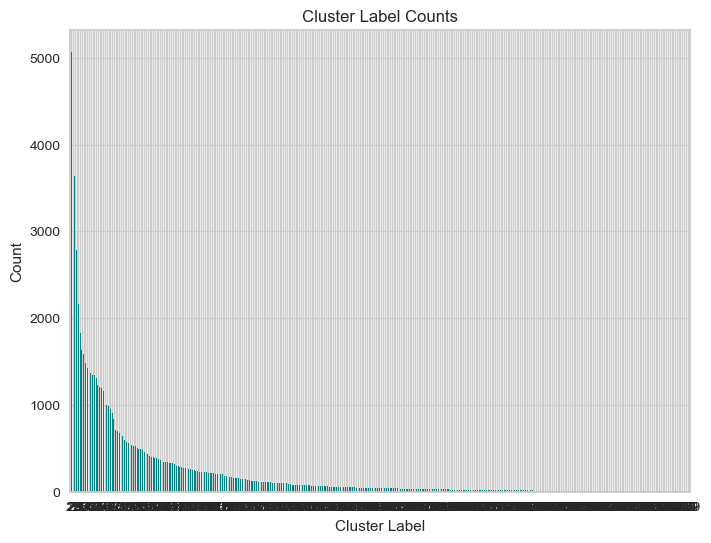

In [22]:
# Profiling and visualization
plot_cluster_profiling(df, dbscan_labels, "DBSCAN", annot_size = 2)
f.plot_counts(dbscan_labels)

# 4. Cluster Evaluation

<a href="#top">Top &#129033;</a>

### Quality of clustering

Before proceeding with further analysis, we need to validate that our clusters align with our expectations. This involves two key steps:  

1. **Visual Inspection:** we need to check whether the clusters make intuitive sense. Do examples that we consider similar fall into the same cluster? If not, we may need to reconsider our clustering approach or features, for instance.


2. **Quantitative Metrics:** we will evaluate our cluster quality using two metrics: 
- cluster cardinality: Cluster cardinality refers to the number of examples in each cluster. Very large or very small clusters might indicate issues, like one cluster capturing mostly noise.

- cluster magnitude: Measures the spread of a cluster, measured by the total distance of all points to the cluster center. Clusters with very high magnitude may contain more dispersed data points.

Visual Inspection

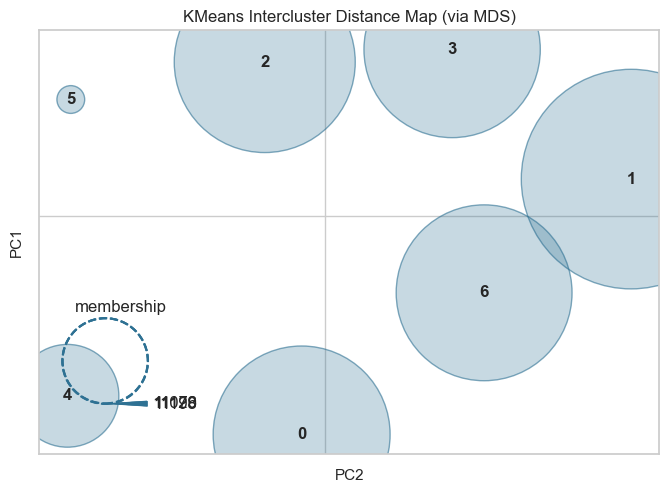

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [18]:
# Visualizing the clusters sizes and distances in 2D
visualizer = InterclusterDistance(kmeans)
visualizer.fit(X_pca13)
visualizer.show()

**Silhouette**

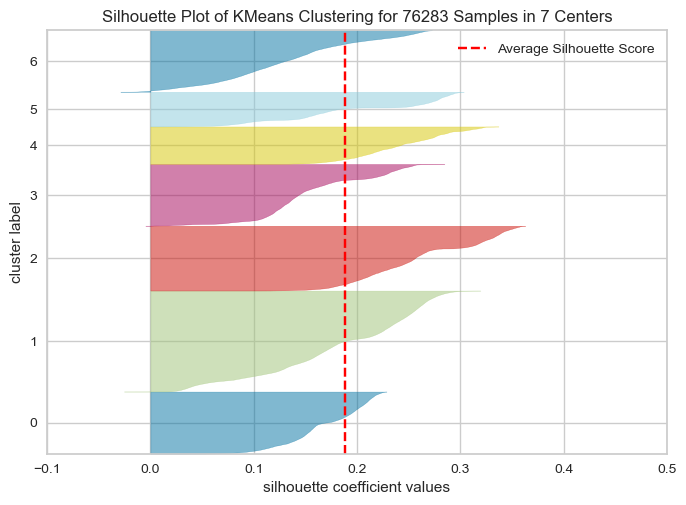

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 76283 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [21]:
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_pca13)
visualizer.show()

Cluster Cardinality

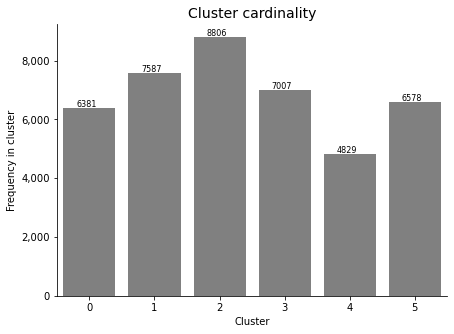

In [ ]:
# Plot clusters cardinality 

# Count observations per cluster
freqByCluster = X_beforeNorm.groupby(y_kmeans).size()

# Draw
fig, ax = plt.subplots(figsize=(7,5))
g = sns.countplot(x=y_kmeans, color='grey')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
for index,data in enumerate(freqByCluster):
    plt.text(x=index-0.2 , y=data+50 , s=f"{data}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
sns.despine()
plt.title("Cluster cardinality", fontsize=plots_Title_fontSize)
plt.xlabel("Cluster")
plt.ylabel("Frequency in cluster")
plt.rc('axes', labelsize=subPlots_label_fontSize)

Cluster Magnitude

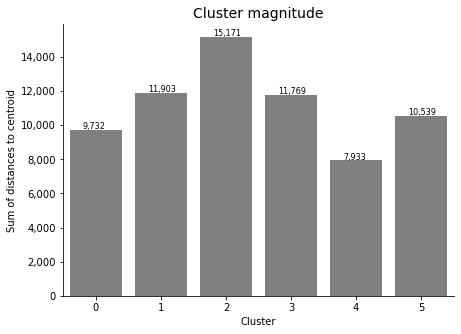

In [ ]:
# Plot clusters magnitude

# Compute Magnitude
X['distanceToCentroid'] = np.min(allDistances,axis=1)
magnitude = X['distanceToCentroid'].groupby(y_kmeans).sum()
X = X.drop(columns=['distanceToCentroid'])

# Draw
fig, ax = plt.subplots(figsize=(7,5))
g = sns.barplot(x=magnitude.index, y=magnitude.values, color='grey')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
for index,data in enumerate(magnitude):
    plt.text(x=index-0.2 , y=data+50 , s=f"{data:,.0f}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
sns.despine()
plt.title("Cluster magnitude", fontsize=plots_Title_fontSize)
plt.xlabel("Cluster")
plt.ylabel("Sum of distances to centroid")
plt.rc('axes', labelsize=subPlots_label_fontSize)

Magnitude versus cardinality

The Cardinality vs Magnitude plot compares cluster cardinality with cluster magnitude. Clusters with a higher cardinality tend to also have a higher cluster magnitude. Using this graph, we can identify anomalous clusters by looking for ones that are not very close to the 45-degree line.

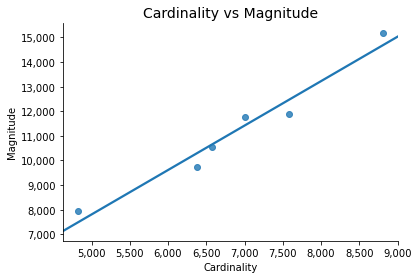

In [ ]:
# Plot cardinality vs magnitude

# Draw
fig, ax = plt.subplots(figsize=(6,4))
g = sns.regplot(x=freqByCluster, y=magnitude, scatter=True, seed=123,truncate=False, ci=None)

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.xaxis.set_major_formatter(tick)
ax.yaxis.set_major_formatter(tick)
sns.despine()
plt.title("Cardinality vs Magnitude", fontsize=plots_Title_fontSize)
plt.xlabel("Cardinality")
plt.ylabel("Magnitude")
plt.rc('axes', labelsize=subPlots_label_fontSize)